In [147]:
import pandas as pd 
import matplotlib
import matplotlib.pyplot as plt 
import numpy as np 


In [148]:
from sklearn import metrics
from sklearn.cluster import KMeans

import warnings
warnings.filterwarnings("ignore")

In [149]:
df1 = pd.read_csv("scenario2-training-dataset-transformed-tf.csv")


In [150]:
df = df1.sample(frac=1).reset_index(drop=True)


(23233, 6)

In [151]:
df[df.isnull().any(axis=1)]

,insiderthreat,vector,date,user,source,action
31,1,2,1282694400,WDT1634,PC-3774,NaN
45,1,2,1289952000,BYO1846,PC-8402,NaN
84,1,2,1283212800,WDT1634,PC-3774,NaN
101,1,2,1298332800,JPH1910,PC-3778,NaN
157,1,2,1281657600,ZIE0741,PC-9132,NaN
...,...,...,...,...,...,...
23162,1,2,1292371200,BYO1846,PC-8402,NaN
23175,1,2,1298505600,JPH1910,PC-3778,NaN
23186,1,2,1292544000,HXP0976,PC-4657,NaN
23203,1,2,1281139200,VCF1602,PC-2228,NaN


,insiderthreat,vector,date
count,23233.000000,23233.000000,2.323300e+04
mean,0.612577,0.880127,1.278444e+09
std,0.487172,0.974431,1.322335e+07
min,0.000000,0.000000,1.262589e+09
25%,0.000000,0.000000,1.263309e+09
50%,1.000000,0.000000,1.281053e+09
75%,1.000000,2.000000,1.289174e+09
max,1.000000,3.000000,1.305072e+09


In [152]:
df['action'].unique()

array(['BSM953@northropgrumman.com',
       'http://linkedin.com/PybfvatCebwrpgwbofrnepu1479839504.htm',
       'Disconnect', ..., 'http://businessweek.com',
       'http://paintcircle.org', 'http://wise-natural.org'], dtype=object)

In [153]:
from sklearn import preprocessing
label_encoding = preprocessing.LabelEncoder()
df['user'] = label_encoding.fit_transform(df['user'])
df['source'] = label_encoding.fit_transform(df['source'])
df['action'] = label_encoding.fit_transform(df['action'].astype(str))

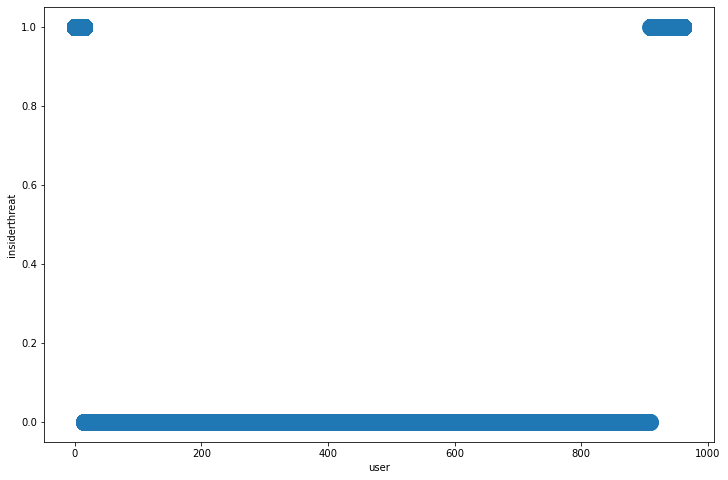

In [154]:
fig, ax = plt.subplots(figsize=(12,8))
plt.scatter(df['user'], df['insiderthreat'], s=250)
plt.xlabel('user')
plt.ylabel('insiderthreat')
plt.show()

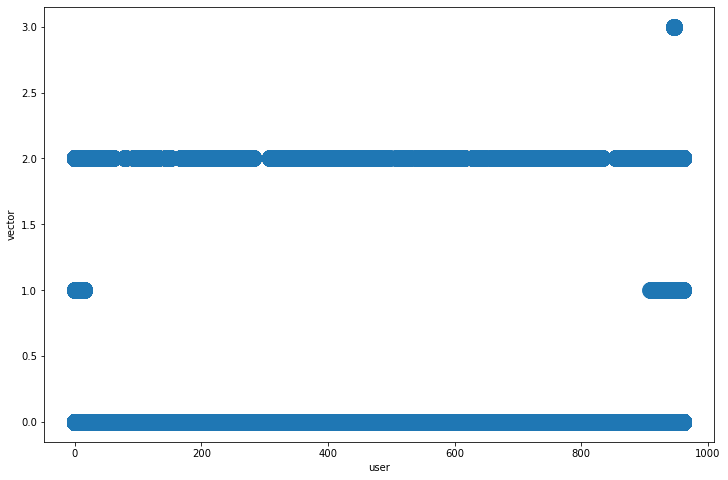

In [155]:
fig, ax = plt.subplots(figsize=(12,8))
plt.scatter(df['user'], df['vector'], s=250)
plt.xlabel('user')
plt.ylabel('vector')
plt.show()

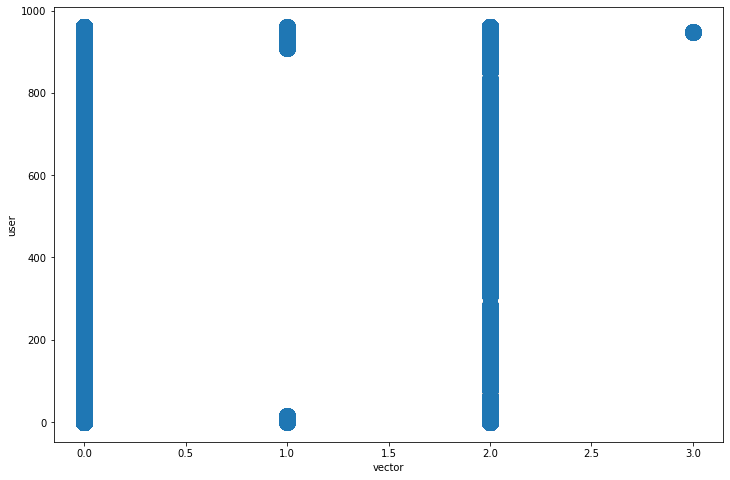

In [156]:
fig, ax = plt.subplots(figsize=(12,8))
plt.scatter(df['vector'], df['user'], s=250)
plt.xlabel('vector')
plt.ylabel('user')
plt.show()

In [157]:
df.head()

,insiderthreat,vector,date,user,source,action
0,1,1,1277942400,949,975,17
1,1,0,1296086400,927,732,747
2,1,2,1300060800,914,973,35
3,1,0,1291075200,937,950,760
4,0,0,1262628120,50,101,1402


In [158]:

from sklearn.preprocessing import StandardScaler
df_arr = StandardScaler().fit_transform(df)

In [159]:
model = KMeans(n_clusters=2, max_iter=1000).fit(df_arr)

In [160]:
model.labels_
model_centroid = model.cluster_centers_

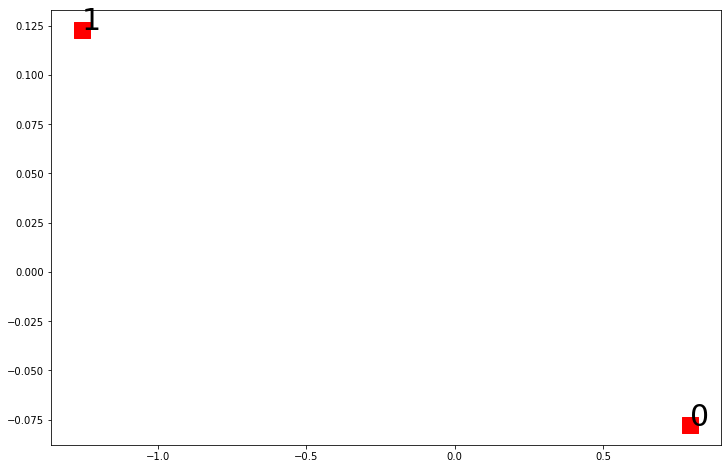

In [161]:
fig, ax = plt.subplots(figsize=(12, 8))

plt.scatter(model_centroid[:,0], model_centroid[:,1], c='r', s=250, marker='s')

for i in range(len(model_centroid)):
    plt.annotate(i, (model_centroid[i][0], model_centroid[i][1]), fontsize=30)

In [162]:
insiderthreat_labels_ = df['insiderthreat']
print("Homogeneity_score: ", metrics.homogeneity_score(insiderthreat_labels_, model.labels_))

print("Completeness_score: ", metrics.completeness_score(insiderthreat_labels_, model.labels_))

print("v_measure_score: ", metrics.v_measure_score(insiderthreat_labels_, model.labels_))

print("Adjusted_rand_score: ", metrics.adjusted_rand_score(insiderthreat_labels_, model.labels_))

print("Adjusted_mutual_info_score: ", metrics.adjusted_mutual_info_score(insiderthreat_labels_,  model.labels_))


Homogeneity_score:  1.0
Completeness_score:  1.0
v_measure_score:  1.0
Adjusted_rand_score:  1.0
Adjusted_mutual_info_score:  1.0


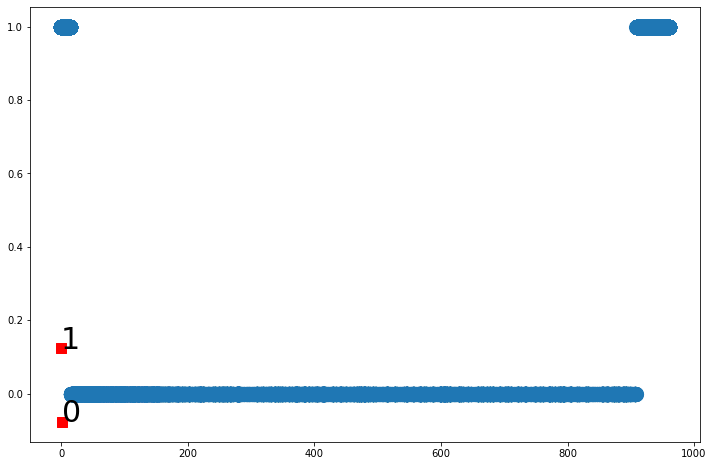

In [163]:
colors = ['yellow','blue','green']

plt.figure(figsize=(12, 8))

plt.scatter(df['user'], df['insiderthreat'], s=200,
            cmap=matplotlib.colors.ListedColormap(colors), alpha=0.8)

plt.scatter(model_centroid[:,0], model_centroid[:,1], c='r', s=100, marker='s')

for i in range(len(model_centroid)):
    plt.annotate( i, (model_centroid[i][0], model_centroid[i][1]), fontsize=30)